# *Olympics Games*
## Group Number : 20
### Members: 
#### Neta Or Shaul
#### Ariel Ashkenazi
Link to source: https://www.kaggle.com/datasets/bhanupratapbiswas/olympic-data/code

Link to github project page: https://github.com/NetaShaul/OlympicGame

Kagel sources:The Olympics Games - collection methodology

<center><img src= "https://raw.githubusercontent.com/NetaShaul/OlympicGame/main/giphy.gif"
     width="700"  > </center>


In [83]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.subplots as sp
from plotly.subplots import make_subplots
import plotly.express as px

In [84]:
url = 'https://raw.githubusercontent.com/NetaShaul/OlympicGame/main/dataset_olympics.csv'
first_olymp_df= pd.read_csv(url)
print(first_olymp_df.shape)
first_olymp_df.head()

(70000, 15)


,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


Our data consists of 15 columns and 70,000 rows

In [85]:
additional_data_df = pd.read_csv('https://raw.githubusercontent.com/NetaShaul/OlympicGame/main/noc_region.csv')
print(additional_data_df.shape)
additional_data_df.head()

(230, 3)


,noc_region,reg,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [86]:
num_of_team = len(first_olymp_df['Team'].unique())
num_of_NOC = len(first_olymp_df['NOC'].unique())
print(f"Count of Team:{num_of_team}\nCount of NOC:{num_of_NOC}")

Count of Team:827
Count of NOC:226


We saw that there is a discrepancy between the number of countries and the number of country symbols. We checked the names of the countries and saw that there are countries that are called twice with the letter changed, but it is the same country. In addition, we saw that there is another file that belongs to the data of a table that matches the names of the countries and their symbols, so we decided to add Another column for the data of the names of the countries

In [87]:
change_olp_df = pd.merge(first_olymp_df, additional_data_df[['noc_region','reg']], left_on='NOC', right_on='noc_region', how='left')
change_olp_df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,noc_region,reg
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,CHN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,CHN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,DEN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,DEN,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,NED,Netherlands


In [88]:
rows_with_missing_values = change_olp_df[change_olp_df['reg'].isna()]
rows_with_missing_values.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,noc_region,reg
578,332,Zarinah Abdullah,F,21.0,NaN,NaN,Singapore,SGP,1992 Summer,1992,Summer,Barcelona,Badminton,Badminton Women's Singles,NaN,NaN,NaN
579,332,Zarinah Abdullah,F,25.0,NaN,NaN,Singapore,SGP,1996 Summer,1996,Summer,Atlanta,Badminton,Badminton Women's Singles,NaN,NaN,NaN
2719,1515,Saiyidah Aisyah Mohamed Rafa'ee,F,28.0,173.0,68.0,Singapore,SGP,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Single Sculls,NaN,NaN,NaN
6267,3515,Paulo Amotun Lokoro,M,24.0,170.0,61.0,Refugee Olympic Athletes,ROT,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,"Athletics Men's 1,500 metres",NaN,ROT,NaN
7659,4264,Ang Peng Siong,M,21.0,180.0,75.0,Singapore,SGP,1984 Summer,1984,Summer,Los Angeles,Swimming,Swimming Men's 100 metres Freestyle,NaN,NaN,NaN


Checking if there are missing values in the reg column

In [89]:
change_olp_df.loc[change_olp_df['reg'].isna(), 'reg'] = change_olp_df.loc[change_olp_df['reg'].isna(), 'Team']

We saw that there were places in the 'reg' column that had NaN values, so we substituted the correct values ​​from the 'Team' column instead.

In [90]:
change_olp_df[change_olp_df['noc_region'] != change_olp_df['NOC']].head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,noc_region,reg
578,332,Zarinah Abdullah,F,21.0,NaN,NaN,Singapore,SGP,1992 Summer,1992,Summer,Barcelona,Badminton,Badminton Women's Singles,NaN,NaN,Singapore
579,332,Zarinah Abdullah,F,25.0,NaN,NaN,Singapore,SGP,1996 Summer,1996,Summer,Atlanta,Badminton,Badminton Women's Singles,NaN,NaN,Singapore
2719,1515,Saiyidah Aisyah Mohamed Rafa'ee,F,28.0,173.0,68.0,Singapore,SGP,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Single Sculls,NaN,NaN,Singapore
7659,4264,Ang Peng Siong,M,21.0,180.0,75.0,Singapore,SGP,1984 Summer,1984,Summer,Los Angeles,Swimming,Swimming Men's 100 metres Freestyle,NaN,NaN,Singapore
7660,4264,Ang Peng Siong,M,21.0,180.0,75.0,Singapore,SGP,1984 Summer,1984,Summer,Los Angeles,Swimming,Swimming Men's 4 x 100 metres Freestyle Relay,NaN,NaN,Singapore


In [91]:
olympic_df = change_olp_df.drop(columns=['noc_region', 'Team'])
olympic_df.shape

(70000, 15)

We deleted the columns Team and noc region so that we don't have duplicate columns with the same meaning

In [92]:
olympic_df.head()

,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,reg
0,1,A Dijiang,M,24.0,180.0,80.0,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands


In [93]:
olympic_df.dtypes

ID          int64
Name       object
Sex        object
Age       float64
Height    float64
Weight    float64
NOC        object
Games      object
Year        int64
Season     object
City       object
Sport      object
Event      object
Medal      object
reg        object
dtype: object

In order to know how to work with the data, we wanted to know the type of object in each column



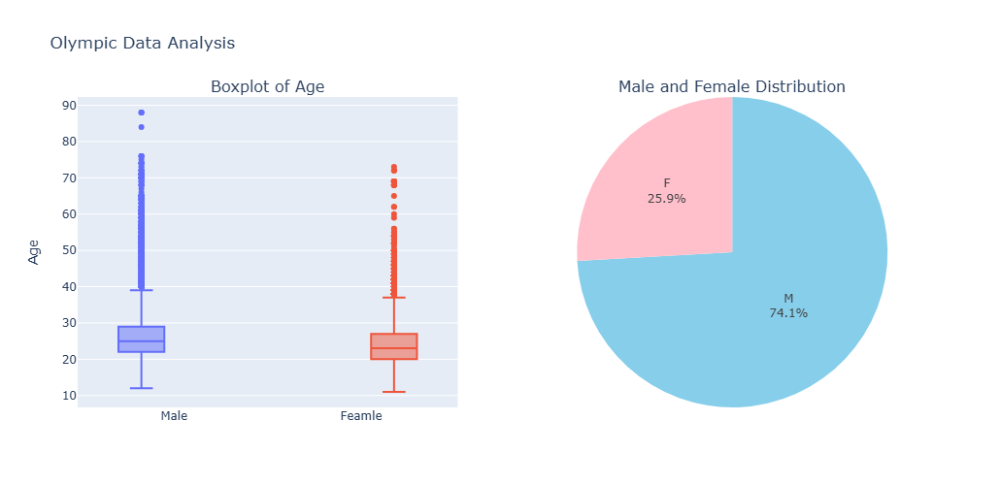

In [94]:
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=('Boxplot of Age', 'Male and Female Distribution'), specs=[[{'type': 'box'}, {'type': 'pie'}]])

fig.update_layout(title='Age Distribution Across Different Sport Categories', yaxis_title='Age', boxmode='group', height=500)
fig.add_trace(go.Box(y=olympic_df[olympic_df.Sex == "M"]['Age'], name='Male'), row=1, col=1)
fig.add_trace(go.Box(y=olympic_df[olympic_df.Sex == "F"]['Age'], name='Feamle'), row=1, col=1)

sex_counts = olympic_df['Sex'].value_counts()
fig.add_trace(go.Pie(labels=sex_counts.index, values=sex_counts.values, textinfo='percent+label', marker=dict(colors=['skyblue', 'pink'])), row=1, col=2)
fig.update_layout(title='Olympic Data Analysis', showlegend=False)
fig.show()

Age and gender distribution of the Olympic participants.

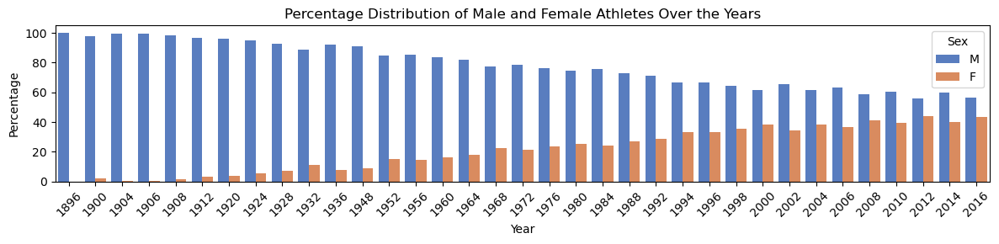

In [95]:
percentages = olympic_df.groupby(['Year', 'Sex']).size() / olympic_df.groupby('Year').size() * 100
percentages = percentages.reset_index(name='Percentage')
plt.figure(figsize=(12, 3))
sns.barplot(x="Year", y="Percentage", hue="Sex", data=percentages, palette='muted')
plt.xlabel("Year")
plt.ylabel("Percentage")
plt.title("Percentage Distribution of Male and Female Athletes Over the Years")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Male and female participation percentages in the Olympic games over the years. It can be seen that there is an increasing trend in women's participation over the years

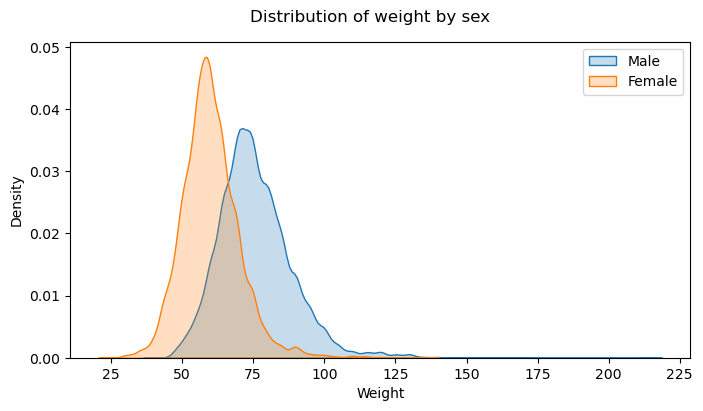

In [96]:
fig, ax = plt.subplots(figsize=(8, 4))
sns.kdeplot(data=olympic_df[olympic_df.Sex == "M"], x='Weight', ax=ax, label='Male', fill=True)
sns.kdeplot(data=olympic_df[olympic_df.Sex == "F"], x='Weight', ax=ax, label='Female', fill=True)
plt.subplots_adjust(top=0.9)
plt.suptitle('Distribution of weight by sex')
plt.legend()
plt.show()

Distribution function of weights by gender

## Conclusion 1: Age of competitors
---



In [97]:
female_df = olympic_df[olympic_df['Sex'] == 'F'].copy()
female_df['Medal'] = female_df['Medal'].fillna(0)
female_medal_df = female_df[['Age','Medal']]
female_medal_df.loc[female_medal_df['Medal'] != 0, 'Medal'] = 1

In [98]:
male_df = olympic_df[olympic_df['Sex'] == 'M'].copy()
male_df['Medal'] = male_df['Medal'].fillna(0)
male_medal_df = male_df[['Age','Medal']]
male_medal_df.loc[male_medal_df['Medal'] != 0, 'Medal'] = 1

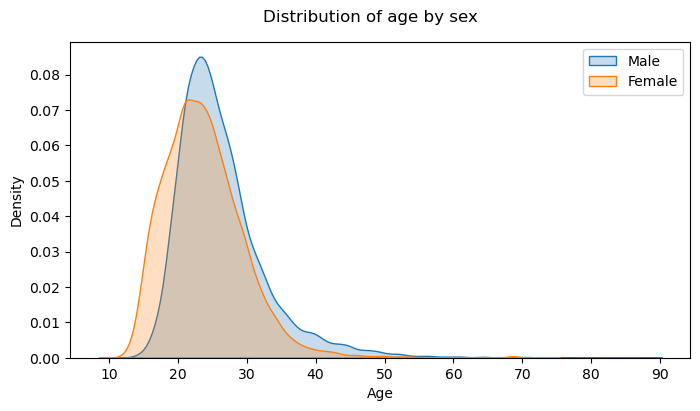

In [99]:
fig, ax = plt.subplots(figsize=(8, 4))
sns.kdeplot(data=olympic_df[olympic_df.Sex == "M"], x='Age', ax=ax, label='Male', fill=True)
sns.kdeplot(data=olympic_df[olympic_df.Sex == "F"], x='Age', ax=ax, label='Female', fill=True)
plt.subplots_adjust(top=0.9)
plt.suptitle('Distribution of age by sex')
plt.legend()
plt.show()

In [100]:
bins = range(11, 76, 3)
labels = [f'{b}-{b+2}' for b in bins[:-1]]
female_medal_df = female_medal_df.copy()
female_medal_df.loc[:, 'Age Group'] = pd.cut(female_medal_df['Age'], bins=bins, right=False, labels=labels)
female_age_group_stats = female_medal_df.groupby('Age Group')['Medal'].mean() * 100
female_age_group_df = pd.DataFrame({
    'Age Group': female_age_group_stats.index,
    'Percentage of Medals': female_age_group_stats.values})

In [101]:
bins = range(11, 90, 3)
labels = [f'{b}-{b+2}' for b in bins[:-1]]
male_medal_df = male_medal_df.copy()
male_medal_df.loc[:, 'Age Group'] = pd.cut(male_medal_df['Age'], bins=bins, right=False, labels=labels)
male_age_group_stats = male_medal_df.groupby('Age Group')['Medal'].mean() * 100
male_age_group_df = pd.DataFrame({
    'Age Group': male_age_group_stats.index,
    'Percentage of Medals': male_age_group_stats.values})

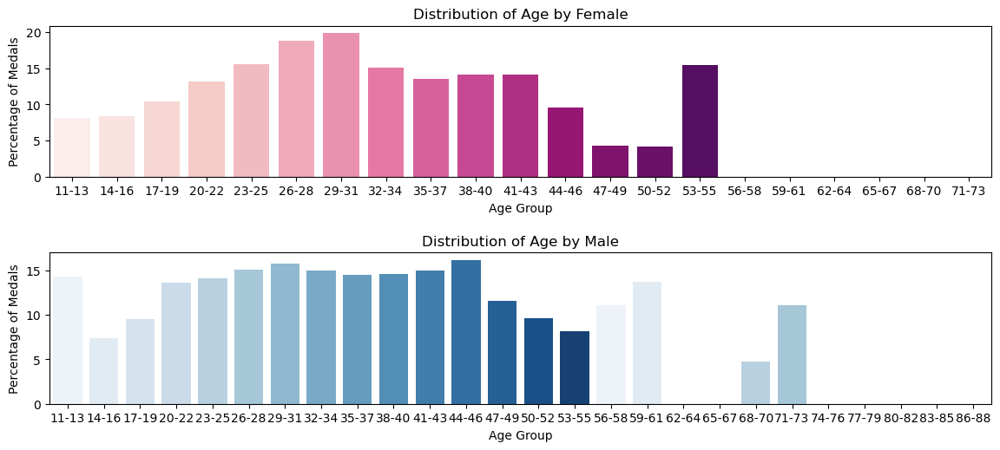

In [102]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(14, 4))
pink_palette = sns.color_palette("RdPu", n_colors=15) 
blue_palette = sns.color_palette("Blues", n_colors=15)

sns.barplot(data=female_age_group_df, x='Age Group', y ='Percentage of Medals', label='Female', fill=True, ax=axes[0],palette=pink_palette)
axes[0].set_title('Distribution of Age by Female')

sns.barplot(data=male_age_group_df, x='Age Group', y ='Percentage of Medals', label='Male', fill=True, ax=axes[1],palette=blue_palette)
axes[1].set_title('Distribution of Age by Male')
plt.subplots_adjust(top=1.2, hspace=0.5)
plt.show()

The percentages of winning medals in relation to age groups for men and women.
It can be seen that relatively among the women aged 26-31, the winning percentage among the participants is high, while among the men, the winning percentage is similar in most age groups (20-46)

In [103]:
age_counts_male = male_df['Age'].value_counts()
most_common_age_male = age_counts_male.idxmax()
most_common_age_count_male = age_counts_male.max()

print("Most common age (male):", most_common_age_male, "Count:", most_common_age_count_male)

age_counts_female = female_df['Age'].value_counts()
most_common_age_female = age_counts_female.idxmax()
most_common_age_count_female = age_counts_female.max()

print("Most common age (Female):", most_common_age_female, "Count:", most_common_age_count_female)


Most common age (male): 23.0 Count: 4271
Most common age (Female): 21.0 Count: 1402


In [104]:
Ball_Sports = olympic_df['Sport'].isin(['Badminton', 'Baseball', 'Basketball', 'Beach Volleyball', 'Cricket', 'Football', 'Golf', 'Handball', 'Hockey', 'Lacrosse', 'Rugby', 'Rugby Sevens', 'Softball', 'Table Tennis', 'Tennis', 'Volleyball', 'Jeu De Paume'])
Ice_Sports = olympic_df['Sport'].isin(['Alpine Skiing', 'Bobsleigh', 'Cross Country Skiing', 'Curling', 'Figure Skating', 'Freestyle Skiing', 'Ice Hockey', 'Nordic Combined', 'Short Track Speed Skating', 'Skeleton', 'Ski Jumping', 'Snowboarding', 'Speed Skating', 'Military Ski Patrol', 'Alpinism'])
Water_Sports = olympic_df['Sport'].isin(['Canoeing', 'Diving', 'Rowing', 'Sailing', 'Swimming', 'Synchronized Swimming', 'Water Polo', 'Motorboating'])
Racket_games = olympic_df['Sport'].isin(['Basque Pelota', 'Racquets', 'Roque', 'Tug-Of-War'])
Fighting = olympic_df['Sport'].isin(['Weightlifting', 'Boxing', 'Judo', 'Wrestling'])
Aerobic = olympic_df['Sport'].isin(['Gymnastics', 'Rhythmic Gymnastics', 'Trampolining', 'Triathlon'])
Other = olympic_df['Sport'].isin(['Shooting', 'Art Competitions', 'Modern Pentathlon'])

In [105]:
ball_sports_df = olympic_df[olympic_df['Sport'].isin(['Badminton', 'Baseball', 'Basketball', 'Beach Volleyball', 'Cricket', 'Football', 'Golf', 'Handball', 'Hockey', 'Lacrosse', 'Rugby', 'Rugby Sevens', 'Softball', 'Table Tennis', 'Tennis', 'Volleyball', 'Jeu De Paume'])]
ice_sports_df = olympic_df[olympic_df['Sport'].isin(['Alpine Skiing', 'Bobsleigh', 'Cross Country Skiing', 'Curling', 'Figure Skating', 'Freestyle Skiing', 'Ice Hockey', 'Nordic Combined', 'Short Track Speed Skating', 'Skeleton', 'Ski Jumping', 'Snowboarding', 'Speed Skating', 'Military Ski Patrol', 'Alpinism'])]
water_sports_df = olympic_df[olympic_df['Sport'].isin(['Canoeing', 'Diving', 'Rowing', 'Sailing', 'Swimming', 'Synchronized Swimming', 'Water Polo', 'Motorboating'])]
racket_games_df = olympic_df[olympic_df['Sport'].isin(['Basque Pelota', 'Racquets', 'Roque', 'Tug-Of-War'])]
fighting_df = olympic_df[olympic_df['Sport'].isin(['Weightlifting', 'Boxing', 'Judo', 'Wrestling'])]
aerobic_df = olympic_df[olympic_df['Sport'].isin(['Gymnastics', 'Rhythmic Gymnastics', 'Trampolining', 'Triathlon'])]
other_df = olympic_df[olympic_df['Sport'].isin(['Shooting', 'Art Competitions', 'Modern Pentathlon'])]


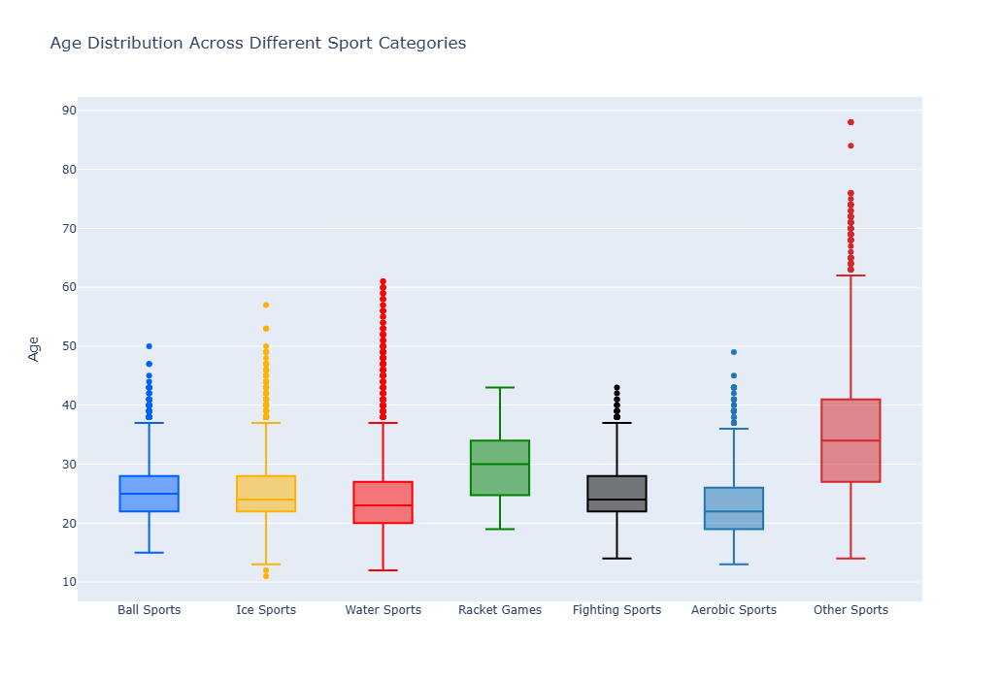

In [106]:
fig = go.Figure()
fig.add_trace(go.Box(y=ball_sports_df['Age'], name='Ball Sports', showlegend=False, marker_color='rgb(0, 97, 255)'))   
fig.add_trace(go.Box(y=ice_sports_df['Age'], name='Ice Sports',  showlegend=False,marker_color='rgb(255, 179, 0)'))    
fig.add_trace(go.Box(y=water_sports_df['Age'], name='Water Sports',  showlegend=False,marker_color='rgb(255, 0, 0)'))   
fig.add_trace(go.Box(y=racket_games_df['Age'], name='Racket Games', showlegend=False, marker_color='rgb(0, 128, 0)'))   
fig.add_trace(go.Box(y=fighting_df['Age'], name='Fighting Sports', showlegend=False,marker_color='rgb(0, 0, 0)'))      
fig.add_trace(go.Box(y=aerobic_df['Age'], name='Aerobic Sports', showlegend=False, marker_color='rgb(31, 119, 180)'))    
fig.add_trace(go.Box(y=other_df['Age'], name='Other Sports', showlegend=False, marker_color='rgb(214, 39, 40)'))         

fig.update_layout(title='Age Distribution Across Different Sport Categories', yaxis_title='Age', boxmode='group', height=700, width=1000)
fig.update_traces(width=0.5)

fig.show()

We showed a distribution of ages by sport category using a boxplot for men who won medals, men who did not win a medal and the same for women.
It can be seen that there are age exceptions from what we would expect in the Olympics - there are participants in their 80s and close to 90.  


* Now, we wanted to check in which sport more specifically people over retirement age participated, Pension age for women - 65 Pension age for men - 67

In [107]:
women_over_65 = olympic_df[(olympic_df['Sex'] == 'F') & (olympic_df['Age'] > 65)]
men_over_67 = olympic_df[(olympic_df['Sex'] == 'M') & (olympic_df['Age'] > 67)]
women_over_65_unique = women_over_65.drop_duplicates(subset=['Name'])
men_over_67_unique = men_over_67.drop_duplicates(subset=['Name'])
print("Number of unique women participants over 65:", len(women_over_65_unique))
print("Number of unique men participants over 67:", len(men_over_67_unique))

Number of unique women participants over 65: 3
Number of unique men participants over 67: 18


**Men compete past retirement age**

In [108]:
men_over_67_unique_year = men_over_67.groupby('Name')['Year'].nunique().reset_index()
men_over_67_unique_times = men_over_67_unique_year.merge(men_over_67[['Name', 'Age']].drop_duplicates(), on='Name', how='inner')
men_over_67_unique_times

,Name,Year,Age
0,Albin Dbrich,1,76.0
1,Frank Weston Benson,2,70.0
2,Frank Weston Benson,2,74.0
3,George Alfred Elcock,1,76.0
4,George Denholm Armour,2,68.0
5,George Denholm Armour,2,84.0
6,Gino De Finetti,1,71.0
7,Godefroid Devreese,1,74.0
8,John (Herbert Crawford-) Copley (Williamson-),1,73.0
9,Jozu Dupon,1,72.0


We wanted to check whether the participants over the retirement age are seasoned players who participated in previous Olympics.
From this table it can be concluded that the majority of the participants participated for the first time in their lives in the Olympics when they were over retirement age (67).

In [109]:
men_over_67_with_medal = men_over_67[men_over_67['Medal'].notnull()]
sport_counts_medals_unique = men_over_67_with_medal['Sport'].value_counts()
men_over_67_unique = men_over_67.drop_duplicates(subset=['Name'])
men_over_67_sports_unique = men_over_67_unique['Sport'].value_counts()

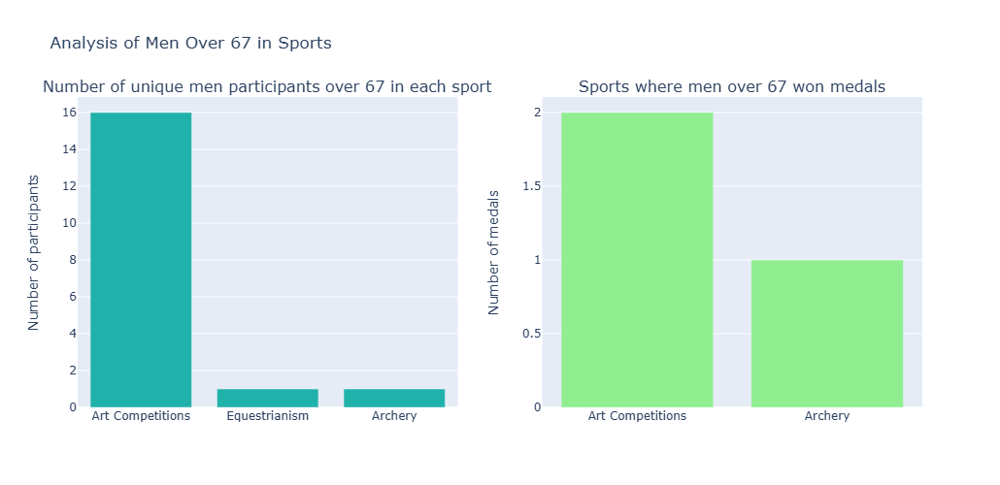

In [110]:
fig = make_subplots(rows=1, cols=2, subplot_titles=('Number of unique men participants over 67 in each sport', 'Sports where men over 67 won medals'))
fig.add_trace(
    go.Bar(x=men_over_67_sports_unique.index, y=men_over_67_sports_unique.values, marker_color='lightseagreen'),
    row=1, col=1)
fig.add_trace(go.Bar(x=sport_counts_medals_unique.index, y=sport_counts_medals_unique.values, marker_color='lightgreen'),row=1, col=2)
fig.update_layout(height=500,width=1000,title_text="Analysis of Men Over 67 in Sports",showlegend=False)
fig.update_xaxes(title_text="", row=1, col=1)
fig.update_yaxes(title_text="Number of participants", row=1, col=1)
fig.update_xaxes(title_text="", row=1, col=2)
fig.update_yaxes(title_text="Number of medals", row=1, col=2)

fig.update_layout(
    height=500,
    width=1000,
    title_text="Analysis of Men Over 67 in Sports",
    showlegend=False)
fig.show()


It can be seen that the sport in which the most participants who have passed the retirement age participate is in an art competition

In terms of victories in medals beyond the retirement age, it can be seen that there are wins in both art competition and archery

In [111]:
men_over_67_with_medal[['Name','Games','Sport', 'Medal','Age']]

,Name,Games,Sport,Medal,Age
44584,John (Herbert Crawford-) Copley (Williamson-),1948 Summer,Art Competitions,Silver,73.0
60009,Jozu Dupon,1936 Summer,Art Competitions,Bronze,72.0
60403,Samuel Harding Duvall,1904 Summer,Archery,Silver,68.0


Men participants over retirement age who won medals.

In [112]:
men_over_67_year = men_over_67.drop_duplicates(subset=['Games'])
men_over_67_year[['Games', 'Sport']]

,Games,Sport
2392,1948 Summer,Art Competitions
7433,1932 Summer,Art Competitions
19308,1936 Summer,Art Competitions
25367,1928 Summer,Art Competitions
58985,1900 Summer,Equestrianism
60402,1904 Summer,Archery


We noticed that the participants over retirement age participated in the range of 1900-1948

In [113]:
art_competition_participants = olympic_df[olympic_df['Sport'] == 'Art Competitions']
equestrianismn_participants = olympic_df[olympic_df['Sport'] == 'Equestrianism']
archery_participants = olympic_df[olympic_df['Sport'] == 'Archery']

print("Years of participation in Art Competition:")
print(sorted(art_competition_participants['Year'].unique()))
print("Years of participation in Equestrianism:")
print(sorted(equestrianismn_participants['Year'].unique()))
print("Years of participation in Archery:")
print(sorted(archery_participants['Year'].unique()))


Years of participation in Art Competition:
[1912, 1920, 1924, 1928, 1932, 1936, 1948]
Years of participation in Equestrianism:
[1900, 1912, 1920, 1924, 1928, 1932, 1936, 1948, 1952, 1956, 1960, 1964, 1968, 1972, 1976, 1980, 1984, 1988, 1992, 1996, 2000, 2004, 2008, 2012, 2016]
Years of participation in Archery:
[1900, 1904, 1908, 1920, 1972, 1976, 1980, 1984, 1988, 1992, 1996, 2000, 2004, 2008, 2012, 2016]


So it turns out that the art section was definitely limited in years and it is understandable why they did not continue to participate in it beyond retirement age
But it can be seen that archery and horse riding in these years were the only times in which men over retirement age participated and the last year in which men over retirement age participated was 1948.

In [114]:
max_age = men_over_67['Age'].max()
participants_max_age_male = men_over_67[men_over_67['Age'] == max_age]
participants_max_age_male

,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,reg
60861,31173,Thomas Cowperthwait Eakins,M,88.0,NaN,NaN,USA,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",NaN,USA
60862,31173,Thomas Cowperthwait Eakins,M,88.0,NaN,NaN,USA,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",NaN,USA
60863,31173,Thomas Cowperthwait Eakins,M,88.0,NaN,NaN,USA,1932 Summer,1932,Summer,Los Angeles,Art Competitions,"Art Competitions Mixed Painting, Unknown Event",NaN,USA


The oldest male competitor was 88 years old and participated in 1932 in three rounds of the art competition, This was his first performance at the Olympics

**Women compete above retirement age**


In [115]:
women_over_65_unique_years = women_over_65.groupby('Name')['Year'].nunique().reset_index()
women_over_65_unique_times = women_over_65_unique_years.merge(women_over_65[['Name', 'Age']].drop_duplicates(), on='Name', how='inner')
women_over_65_unique_times

,Name,Year,Age
0,Anne Marie Carl-Nielsen (Brodersen-),2,69.0
1,Anne Marie Carl-Nielsen (Brodersen-),2,73.0
2,"Lisa ""Louise"" Bianchini (Wadstrm-)",1,68.0
3,Winifred Marie Louise Austen (-Frick),1,72.0


We wanted to check whether the participants over the retirement age are seasoned players who participated in previous Olympics.
From this table it can be concluded that the majority of the participants participated for the first time in their lives in the Olympics when they were over retirement age (65).

In [116]:
women_over_65_with_medal = women_over_65[women_over_65['Medal'].notnull()]
sport_counts_medals_unique_female = women_over_65_with_medal['Sport'].value_counts()
women_over_65_unique = women_over_65.drop_duplicates(subset=['Name'])
women_over_65_sports_unique = women_over_65_unique['Sport'].value_counts()

In [117]:
print("number of female participants who won medals above the age of 65:",len(sport_counts_medals_unique_female))

number of female participants who won medals above the age of 65: 0


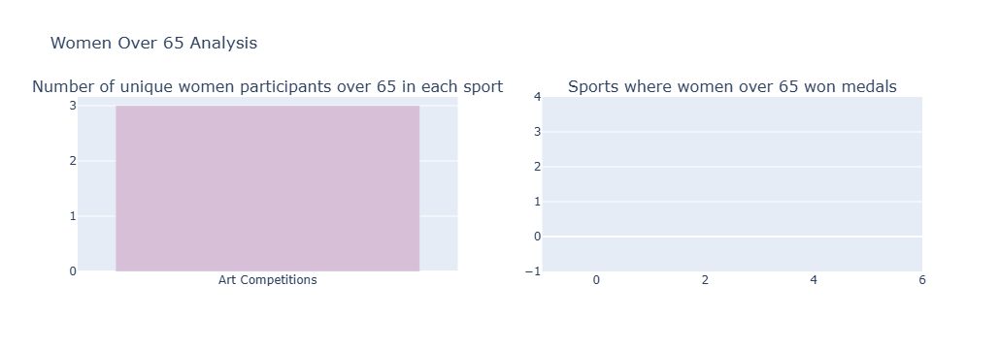

In [118]:
fig = make_subplots(rows=1, cols=2, subplot_titles=('Number of unique women participants over 65 in each sport', 'Sports where women over 65 won medals'))
fig.add_trace(
    go.Bar(x=women_over_65_sports_unique.index, y=women_over_65_sports_unique.values, marker_color='thistle', name='Participants'),
    row=1, col=1)
fig.add_trace(
    go.Bar(x=sport_counts_medals_unique_female.index, y=sport_counts_medals_unique_female.values, marker_color='lightgreen', name='Medals'),
    row=1, col=2)
fig.update_layout(title='Women Over 65 Analysis', showlegend=False)
fig.show()

We will note that all the women who participated over retirement age participated in an art competition

Unlike men, no woman over retirement age has won a medal

In [119]:
max_age = women_over_65['Age'].max()
participants_max_age_female = women_over_65[women_over_65['Age'] == max_age]
participants_max_age_female

,ID,Name,Sex,Age,Height,Weight,NOC,Games,Year,Season,City,Sport,Event,Medal,reg
35445,18252,Anne Marie Carl-Nielsen (Brodersen-),F,73.0,NaN,NaN,DEN,1936 Summer,1936,Summer,Berlin,Art Competitions,"Art Competitions Mixed Sculpturing, Unknown Event",NaN,Denmark


The oldest woman to compete in the Olympics also competed in 1936 in the arts competition And for her, too, this was the first time she participated in the Olympics

**The majority of participants over retirement age participated in the art category (a sports category that began in 1912 and ended in 1948) The oldest participant was 88 years old. The oldest participant was 73 years old. It was the first time for both of them to participate in the Olympics and neither of them won medals.**

<img src="https://raw.githubusercontent.com/NetaShaul/OlympicGame/main/art.png" width="350"/>
<figcaption align="center">
    <small> The attached image is a graphic representation of the event of the art competition in the Olympics. The art competition was an important current in the history of the Olympics, which emphasized the importance of the cultural and moral construction of the games. </small>
</figcaption>

## Conclusion 2: The height of the competitors
---


In [120]:
summer_olympics_df = olympic_df[olympic_df['Season'] == 'Summer']

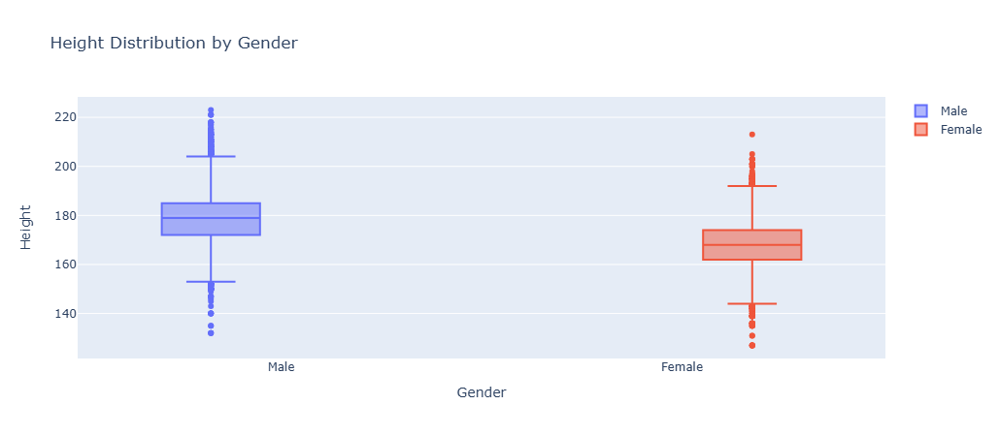

In [121]:
fig = go.Figure()
fig.add_trace(go.Box(y=summer_olympics_df[summer_olympics_df.Sex == "M"]['Height'], name='Male'))
fig.add_trace(go.Box(y=summer_olympics_df[summer_olympics_df.Sex == "F"]['Height'], name='Female'))
fig.update_layout(
    title='Height Distribution by Gender',
    yaxis_title='Height',
    boxmode='group',
    height=450,
    xaxis_title='Gender')
fig.show()

Distribution of helms in men and women

In [122]:
female_summer_df = summer_olympics_df[summer_olympics_df['Sex'] == 'F'].copy()
female_summer_df['Medal'] = female_summer_df['Medal'].fillna(0)
female_summer_df.loc[female_summer_df['Medal'] != 0, 'Medal'] = 1

In [123]:
female_medal_height_df = female_summer_df[['Height','Medal']]

In [124]:
male_summer_df= summer_olympics_df[summer_olympics_df['Sex'] == 'M'].copy()
male_summer_df['Medal'] = male_summer_df['Medal'].fillna(0)
male_summer_df.loc[male_summer_df['Medal'] != 0, 'Medal'] = 1

In [125]:
male_medal_height_df = male_summer_df[['Height','Medal']]

In [126]:
male_bins = np.arange(127.0, 229.0, 7.0)  
male_labels = [f'{int(b)}-{int(b+6)}' for b in male_bins[:-1]]

In [127]:
male_medal_height_df = male_medal_height_df.copy()  
male_medal_height_df.loc[:, 'Height Male Group'] = pd.cut(male_medal_height_df['Height'], bins=male_bins, right=False, labels=male_labels)
male_height_group_stats = male_medal_height_df.groupby('Height Male Group')['Medal'].mean()* 100
male_height_group_df = pd.DataFrame({'Height Male Group': male_height_group_stats.index, 'Percentage of Medals': male_height_group_stats.values})

In [128]:
female_bins = np.arange(127.0, 229.0, 7.0)  
female_labels = [f'{int(b)}-{int(b+6)}' for b in female_bins[:-1]]

In [129]:
female_medal_height_df = female_medal_height_df.copy()  
female_medal_height_df.loc[:, 'Height Female Group'] = pd.cut(female_medal_height_df['Height'], bins=female_bins, right=False, labels=female_labels)
female_height_group_stats = female_medal_height_df.groupby('Height Female Group')['Medal'].mean()* 100
female_height_group_df = pd.DataFrame({'Height Female Group': female_height_group_stats.index, 'Percentage of Medals': female_height_group_stats.values})

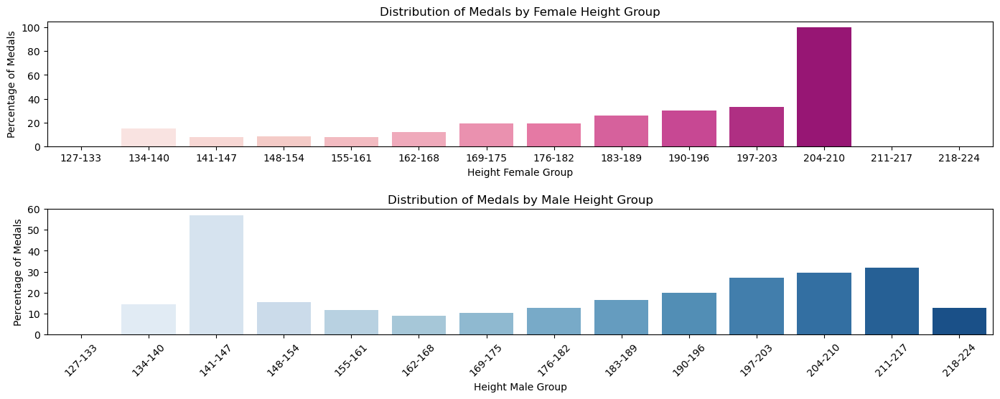

In [130]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(17, 4))
pink_palette = sns.color_palette("RdPu", n_colors=15) 
blue_palette = sns.color_palette("Blues", n_colors=15)
sns.barplot(data=female_height_group_df, x='Height Female Group', y ='Percentage of Medals', label='Female', fill=True, ax=axes[0],palette=pink_palette)
axes[0].set_title('Distribution of Medals by Female Height Group')
axes[0].set_xlabel('Height Female Group')
axes[0].set_ylabel('Percentage of Medals')

sns.barplot(data=male_height_group_df, x='Height Male Group', y ='Percentage of Medals', label='Male', fill=True, ax=axes[1],palette=blue_palette)
axes[1].set_title('Distribution of Medals by Male Height Group')
axes[1].set_xlabel('Height Male Group')
axes[1].set_ylabel('Percentage of Medals')
plt.subplots_adjust(top=1.2, hspace=0.5)
axes[1].tick_params(axis='x', rotation=45)
# plt.suptitle('Age Distribution and Medal Percentage by Female', fontsize=16)
plt.show()

In [131]:
female_medal_height_df[female_medal_height_df['Height Female Group']== '204-210']

,Height,Medal,Height Female Group
39497,205.0,1,204-210


We noticed that women with heights between 204-210 cm have 100 percent success. After checking, we saw that at this height there is only one woman who competed and won a medal, so it stands at 100 percent.

We wanted to see the height distribution of the players in the various professions, whether there is an effect of the player's height on the sport in which he/she participates.

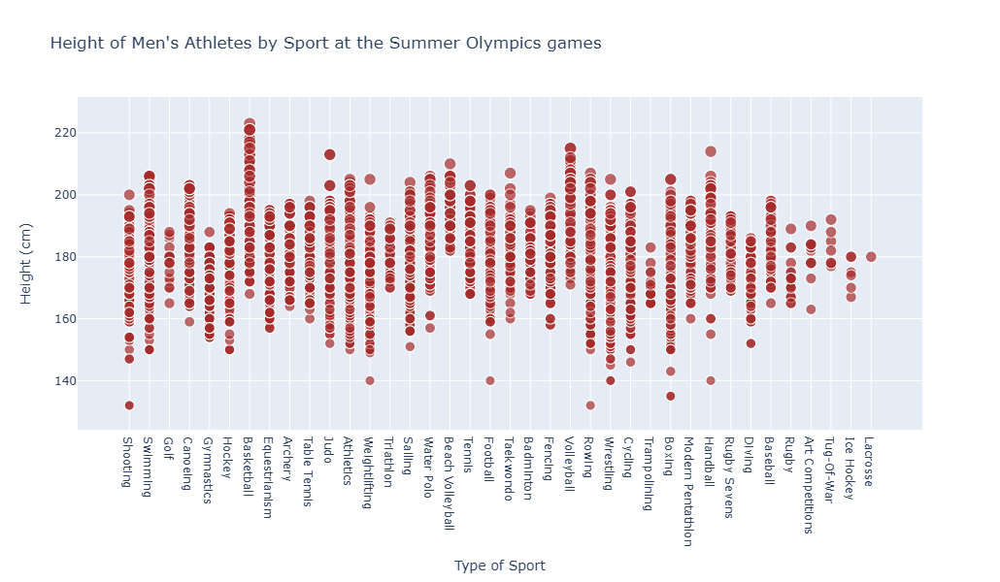

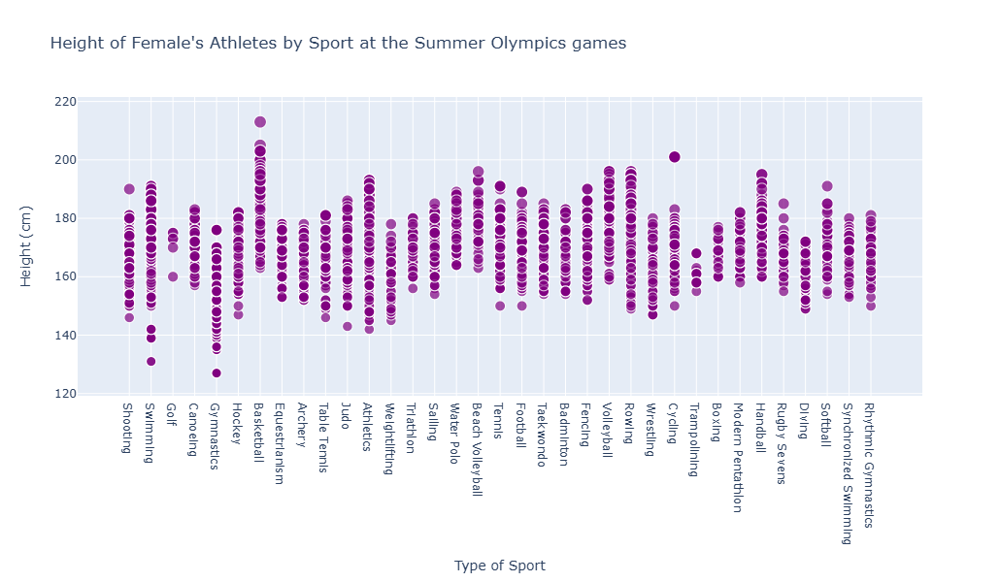

In [132]:
sports_to_exclude = ['Croquet', 'Alpinism', 'Figure Skating']
female_df_cleaned = female_summer_df.dropna(subset=['Height'])
female_df_cleaned = female_df_cleaned[~female_df_cleaned['Sport'].isin(sports_to_exclude)]
male_df_cleaned = male_summer_df.dropna(subset=['Height'])
male_df_cleaned = male_df_cleaned[~male_df_cleaned['Sport'].isin(sports_to_exclude)]
female_sports = female_df_cleaned['Sport'].unique()
male_sports = male_df_cleaned['Sport'].unique()
sport_order = list(set(female_sports) & set(male_sports))
fig1 = px.scatter(male_df_cleaned, 
                  x='Sport', 
                  y='Height', 
                  color_discrete_sequence=['brown'],  
                  size='Height',
                  size_max=13,
                  hover_name='Sport',
                  title="Height of Men's Athletes by Sport at the Summer Olympics games",
                  category_orders={'Sport': sport_order},
                  labels={'Sport': 'Type of Sport', 'Height': 'Height (cm)'},
                  height=600)

fig2 = px.scatter(female_df_cleaned, 
                  x='Sport', 
                  y='Height', 
                  color_discrete_sequence=['purple'],  
                  size='Height',
                  size_max=13,
                  hover_name='Sport',
                  title="Height of Female's Athletes by Sport at the Summer Olympics games",
                  category_orders={'Sport': sport_order},
                  labels={'Sport': 'Type of Sport', 'Height': 'Height (cm)'},
                  height=600)

fig1.show()
fig2.show()

You can see abnormal data for both men and women in the distribution of heights in diving, gymnastics, Basketball and beach volleyball.



In [133]:
female_basketball_df = female_summer_df.loc[(female_summer_df['Sex'] == 'F') & (female_summer_df['Sport'] == 'Basketball')]
female_basketball_height_df = female_basketball_df.copy()
female_basketball_height_df.loc[:, 'Basketball Height Female Group'] = pd.cut(female_basketball_height_df['Height'], bins=female_bins, right=False, labels=female_labels)
female_height_group_stats_basketball = female_basketball_height_df.groupby('Basketball Height Female Group')['Medal'].mean()* 100
female_height_group_basketball_df = pd.DataFrame({'Basketball Height Female Group': female_height_group_stats_basketball.index, 'Percentage of Medals': female_height_group_stats_basketball.values})

In [134]:
female_beach_volleyball_df = female_summer_df.loc[(female_summer_df['Sex'] == 'F') & (female_summer_df['Sport'] == 'Beach Volleyball')]
female_beach_volleyball_height_df = female_beach_volleyball_df.copy()
female_beach_volleyball_height_df.loc[:, 'Beach Volleyball Height Female Group'] = pd.cut(female_beach_volleyball_height_df['Height'], bins=female_bins, right=False, labels=female_labels)
female_height_group_stats_beach_volleyball = female_beach_volleyball_height_df.groupby('Beach Volleyball Height Female Group')['Medal'].mean()* 100
female_height_group_beach_volleyball_df = pd.DataFrame({'Beach Volleyball Height Female Group': female_height_group_stats_beach_volleyball.index, 'Percentage of Medals': female_height_group_stats_beach_volleyball.values})

In [135]:
female_df_cleaned = female_summer_df.loc[female_summer_df['Sex'] == 'F']
filtered_female_df = female_df_cleaned.query("Sport != 'Basketball' and Sport != 'Beach Volleyball'")
filtered_female_df.loc[:, 'Sport'] = 'Other Sports'
filtered_female_height_df = filtered_female_df.copy()
filtered_female_height_df.loc[:, 'Other Sports Height Female Group'] = pd.cut(filtered_female_height_df['Height'], bins=female_bins, right=False, labels=female_labels)
filtered_female_height_group_stats = filtered_female_height_df.groupby('Other Sports Height Female Group')['Medal'].mean()* 100
filtered_female_height_group_df = pd.DataFrame({'Other Sports Height Female Group': filtered_female_height_group_stats.index, 'Percentage of Medals': filtered_female_height_group_stats.values})

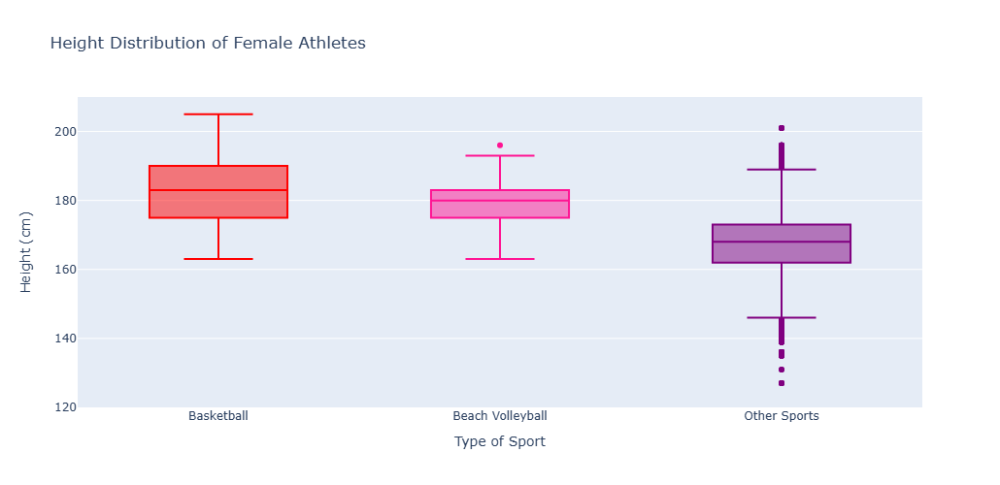

In [136]:
combined_df = pd.concat([female_basketball_df, female_beach_volleyball_df, filtered_female_df])
fig = px.box(combined_df, x='Sport', y='Height', color='Sport',
             title='Height Distribution of Female Athletes',
             labels={'Sport': 'Type of Sport', 'Height': 'Height (cm)'},
             color_discrete_map={'Basketball': 'red', 'Beach Volleyball': 'deeppink', 'Other Sports': 'purple'})
fig.update_yaxes(range=[120, 210], title_text="Height (cm)")
fig.update_layout(showlegend=False, height=500, width=1000)
fig.show()

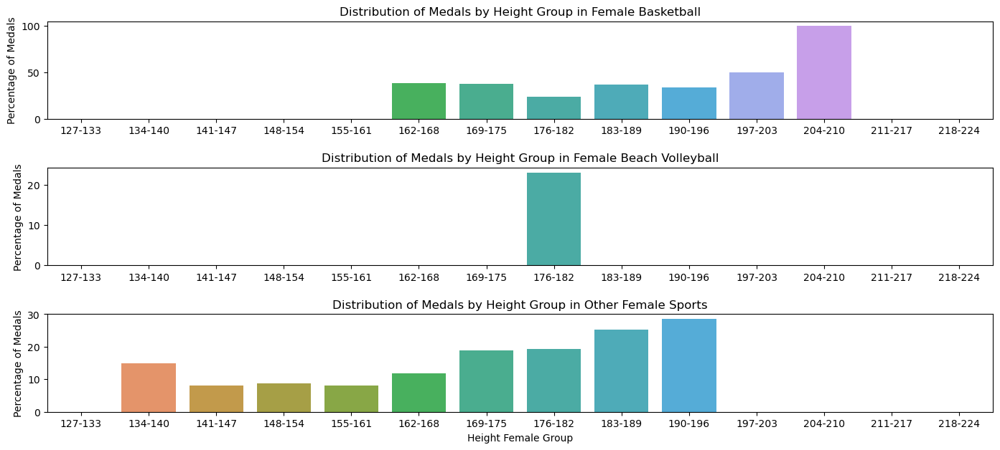

In [137]:
fig, axes = plt.subplots(nrows=3, ncols=1,figsize=(17,5))
sns.barplot(data=female_height_group_basketball_df, x='Basketball Height Female Group', y ='Percentage of Medals', label='Female', fill=True, ax=axes[0])
axes[0].set_title('Distribution of Medals by Height Group in Female Basketball')
axes[0].set_xlabel('')
axes[0].set_ylabel('Percentage of Medals')

sns.barplot(data=female_height_group_beach_volleyball_df, x='Beach Volleyball Height Female Group', y ='Percentage of Medals', label='Female', fill=True, ax=axes[1])
axes[1].set_title('Distribution of Medals by Height Group in Female Beach Volleyball')
axes[1].set_xlabel('')
axes[1].set_ylabel('Percentage of Medals')

sns.barplot(data=filtered_female_height_group_df, x='Other Sports Height Female Group', y ='Percentage of Medals', label='Male', fill=True, ax=axes[2])
axes[2].set_title('Distribution of Medals by Height Group in Other Female Sports')
axes[2].set_xlabel('Height Female Group')
axes[2].set_ylabel('Percentage of Medals')
plt.subplots_adjust(top=1.2, hspace=0.5)
plt.show()

The winning percentages according to heights in the subjects of basketball, beach volleyball and other types of sports besides these.
It is interesting to see that the only wins in this profession for the women were for women of the average height of beach volleyball participants.

In [138]:
male_gymnastics_df = male_summer_df[(male_summer_df['Sex'] == 'M') & (male_summer_df['Sport'] == 'Gymnastics')]
male_gymnastics_height_df = male_gymnastics_df.copy()
male_gymnastics_height_df.loc[:, 'Gymnastics Height Male Group'] = pd.cut(male_gymnastics_height_df['Height'], bins=male_bins, right=False, labels=male_labels)
male_gymnastics_height_group_stats_df = male_gymnastics_height_df.groupby( 'Gymnastics Height Male Group')['Medal'].mean()* 100
male_gymnastics_height_group_df = pd.DataFrame({ 'Gymnastics Height Male Group': male_gymnastics_height_group_stats_df.index, 'Percentage of Medals': male_gymnastics_height_group_stats_df.values})

In [139]:
male_diving_df = male_summer_df[(male_summer_df['Sex'] == 'M') & (male_summer_df['Sport'] == 'Diving')]
male_diving_height_df = male_diving_df.copy()
male_diving_height_df.loc[:, 'Diving Height Male Group'] = pd.cut(male_diving_height_df['Height'], bins=male_bins, right=False, labels=male_labels)
male_diving_height_group_stats_df = male_diving_height_df.groupby( 'Diving Height Male Group')['Medal'].mean()* 100
male_diving_height_group_df = pd.DataFrame({ 'Diving Height Male Group': male_diving_height_group_stats_df.index, 'Percentage of Medals': male_diving_height_group_stats_df.values})

In [140]:
male_df_cleaned = male_summer_df.loc[male_summer_df['Sex'] == 'M']
filtered_male_df = male_df_cleaned.loc[~male_df_cleaned['Sport'].isin(['Gymnastics', 'Diving'])]
filtered_male_df.loc[:, 'Sport'] = 'Other Sports'
filtered_male_height_df = filtered_male_df.copy()
filtered_male_height_df.loc[:, 'Other Sports Height Male Group'] = pd.cut(filtered_male_height_df['Height'], bins=male_bins, right=False, labels=male_labels)
filtered_male_height_group_stats = filtered_male_height_df.groupby('Other Sports Height Male Group')['Medal'].mean()* 100
filtered_male_height_group_df = pd.DataFrame({'Other Sports Height Male Group': filtered_male_height_group_stats.index, 'Percentage of Medals': filtered_male_height_group_stats.values})

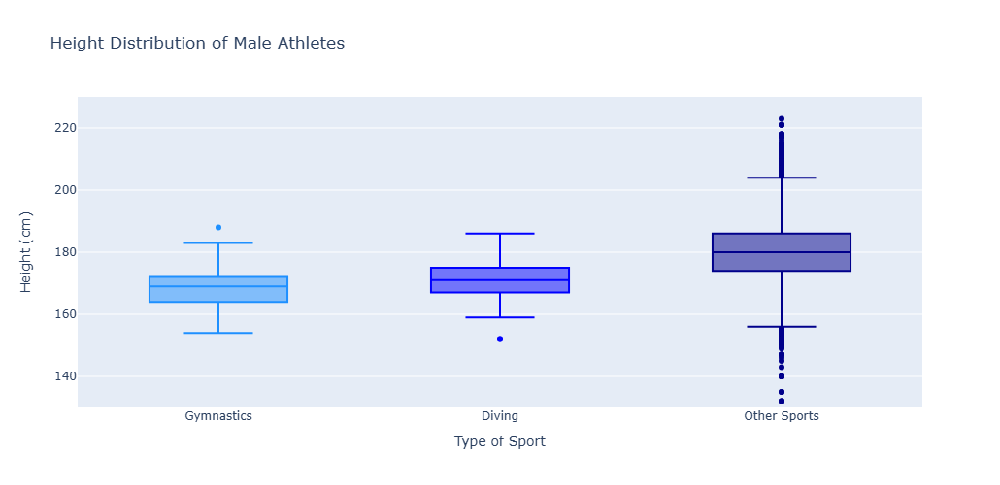

In [141]:
combined_df = pd.concat([male_gymnastics_df, male_diving_df, filtered_male_df])
fig = px.box(combined_df, x='Sport', y='Height', color='Sport',
             title='Height Distribution of Male Athletes',
             labels={'Sport': 'Type of Sport', 'Height': 'Height (cm)'},
             color_discrete_map={'Gymnastics': 'dodgerblue', 'Diving': 'blue', 'Other Sports': 'darkblue'})  
fig.update_yaxes(range=[130, 230], title_text="Height (cm)")
fig.update_layout(showlegend=False, height=500, width=1000)
fig.show()

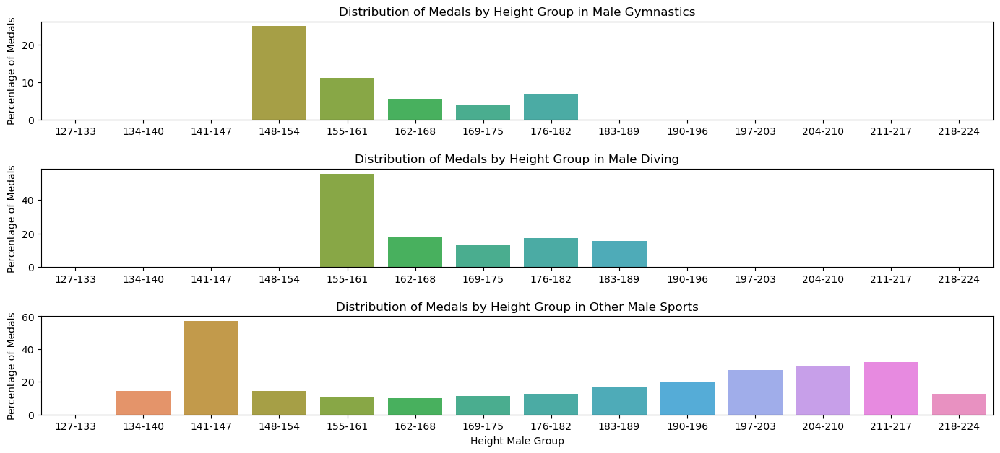

In [142]:
fig, axes = plt.subplots(nrows=3, ncols=1,figsize=(17,5))
sns.barplot(data=male_gymnastics_height_group_df, x='Gymnastics Height Male Group', y ='Percentage of Medals', label='Male', fill=True, ax=axes[0])
axes[0].set_title('Distribution of Medals by Height Group in Male Gymnastics')  
axes[0].set_xlabel('')
axes[0].set_ylabel('Percentage of Medals')

sns.barplot(data=male_diving_height_group_df, x='Diving Height Male Group', y ='Percentage of Medals', label='Male', fill=True, ax=axes[1])
axes[1].set_title('Distribution of Medals by Height Group in Male Diving')
axes[1].set_xlabel('')
axes[1].set_ylabel('Percentage of Medals')

sns.barplot(data=filtered_male_height_group_df, x='Other Sports Height Male Group', y ='Percentage of Medals', label='Male', fill=True, ax=axes[2])
axes[2].set_title('Distribution of Medals by Height Group in Other Male Sports') 
axes[2].set_xlabel('Height Male Group')
axes[2].set_ylabel('Percentage of Medals')
plt.subplots_adjust(top=1.2, hspace=0.5)
plt.show()

The winning percentages according to heights in the disciplines of gymnastics, diving and other types of sports besides these.
It can be seen that the winning percentages of the men who are below the average height participating in these professions are higher than the winning percentages of the other men of average height for this sport.

**The average height of men in the world is: 1.77 and the average height of women in the world is: 1.60. According to the height data of the players participating in these sports, we see that the men participating in diving or gymnastics are shorter than average. In addition, the women who participate in basketball and beach volleyball are much taller than the average height of women.
It can be concluded from these conclusions that in order to succeed in these sports (gymnastics and diving for men, basketball and beach volleyball for women) it is recommended to be above the average height. And for the men it is even recommended to be shorter than the average height of the participants in these sports.**

If you would like to know which sport is recommended for you to participate in, you must enter the following data:

## Conclusion 3: Player participation symbol



In [143]:
top_ath_df = olympic_df.groupby('Name')[['Medal']].count() 
top_ath_df= top_ath_df.reset_index()
top_ath_df = top_ath_df.nlargest(10, 'Medal')
top_ath_df = top_ath_df.merge(olympic_df[['Name','NOC']], on='Name', how='left').drop_duplicates()
top_ath_df

,Name,Medal,NOC
0,Nikolay Yefimovich Andrianov,15,URS
24,Ole Einar Bjrndalen,13,NOR
51,Birgit Fischer-Schmidt,12,GDR
55,Birgit Fischer-Schmidt,12,GER
64,Natalie Anne Coughlin (-Hall),12,USA
76,"Matthew Nicholas ""Matt"" Biondi",11,USA
88,Viktor Ivanovych Chukarin,11,URS
104,Vra slavsk (-Odloilov),11,TCH
122,Aleksandr Nikolayevich Dityatin,10,URS
138,Marit Bjrgen,10,NOR


The top ten athletes in winning medals

In [144]:
nation_representations = olympic_df.groupby('Name')['reg'].nunique().reset_index()
nation_representations = nation_representations.rename(columns={'reg': "Nation's Representations"})
olympic_with_representations = nation_representations.merge(olympic_df[['Name', 'NOC', 'reg', 'Games','Medal','Sport','Age','Sex']], on='Name', how='left')
ath_with_multiple_rep = olympic_with_representations[olympic_with_representations["Nation's Representations"] > 1].copy()
unique_athletes_with_multiple_representations = ath_with_multiple_rep.drop_duplicates(subset=['Name']).sort_values(by="Nation's Representations", ascending=False)
unique_athletes_with_multiple_representations[['Name', "Nation's Representations"]]

,Name,Nation's Representations
42502,Mamadou Diallo,4
68108,Yamil Aldama Pozo (-Dodds),3
31763,"Jasna Fazli-Reed (-Lupulesku-, -Rather)",3
50702,Oksana Aleksandrovna Chusovitina,3
66812,Walentina Fedjuschina (-Sintschenko-),3
...,...,...
23042,Galina isakovov (-Beskrovnaj),2
23349,Gennady Chkhaidze,2
23770,Georges Dubois,2
25071,Glory Alozie Oluchi,2


In [145]:
ath_with_multiple_rep

,Name,Nation's Representations,NOC,reg,Games,Medal,Sport,Age,Sex
52,Aaron Arthur Cook,2,GBR,UK,2008 Summer,NaN,Taekwondo,17.0,M
53,Aaron Arthur Cook,2,MDA,Moldova,2016 Summer,NaN,Taekwondo,25.0,M
102,Abdel Aziz Fahmi El-Shafei,2,EGY,Egypt,1952 Summer,NaN,Water Polo,20.0,M
103,Abdel Aziz Fahmi El-Shafei,2,EGY,Egypt,1952 Summer,NaN,Swimming,20.0,M
104,Abdel Aziz Fahmi El-Shafei,2,UAR,Syria,1960 Summer,NaN,Water Polo,28.0,M
...,...,...,...,...,...,...,...,...,...
69942,ubomra Balov (-Ilanovsk),2,TCH,Czech Republic,1992 Winter,NaN,Cross Country Skiing,23.0,F
69943,ubomra Balov (-Ilanovsk),2,SVK,Slovakia,1994 Winter,NaN,Cross Country Skiing,25.0,F
69944,ubomra Balov (-Ilanovsk),2,SVK,Slovakia,1994 Winter,NaN,Cross Country Skiing,25.0,F
69945,ubomra Balov (-Ilanovsk),2,SVK,Slovakia,1994 Winter,NaN,Cross Country Skiing,25.0,F


During all the years of the Olympics, 205 players played under more than one symbol in 865 appearances.

In [146]:
country_counts = unique_athletes_with_multiple_representations['reg'].value_counts().reset_index()
country_counts.columns = ['Country', 'Athletes changed']
country_counts

,Country,Athletes changed
0,Russia,42
1,Serbia,17
2,Syria,17
3,Egypt,8
4,Romania,6
...,...,...
57,Trinidad,1
58,United Arab Emirates,1
59,Tunisia,1
60,Latvia,1


Russia is the country that has had the most changes under its symbol

In [147]:
male_count = len(unique_athletes_with_multiple_representations[unique_athletes_with_multiple_representations['Sex'] == 'M'])
female_count = len(unique_athletes_with_multiple_representations[unique_athletes_with_multiple_representations['Sex'] == 'F'])
male_count, female_count
description = f"Number of male performances:{male_count}\nNumber of female performances:{female_count}"
print(description)

Number of male performances:143
Number of female performances:62


The men lead the women in the transition of the representation of the countries

In [148]:
athletics_data = unique_athletes_with_multiple_representations[unique_athletes_with_multiple_representations['Sport'] == 'Athletics']
ath_sport = athletics_data[athletics_data["Nation's Representations"] > 1]
male_athletics = len(ath_sport[ath_sport['Sex'] == 'M'])
female_athletics = len(ath_sport[ath_sport['Sex'] == 'F'])

In [149]:
sport_transitions = unique_athletes_with_multiple_representations['Sport'].value_counts()
# מציאת הספורט עם הכי הרבה מעברים
most_transitions_sport = sport_transitions.idxmax()
most_transitions_count = sport_transitions.max()

print(f"The sport with the most transitions is {most_transitions_sport} with {most_transitions_count} transitions.")

The sport with the most transitions is Athletics with 45 transitions.


In [150]:
description = f"Number of male performances:{male_athletics}\nNumber of female performances:{female_athletics}"
print(description)

Number of male performances:17
Number of female performances:28


In [151]:
athletes_with_multiple_representations = ath_with_multiple_rep
athletes_with_multiple_representations['Medal'] = athletes_with_multiple_representations['Medal'].fillna(0)
athletes_with_multiple_representations['Total Medals'] = athletes_with_multiple_representations.groupby('Name')['Medal'].transform(lambda x: (x != 0).sum())

In [152]:
all_ath = olympic_with_representations
all_ath['Medal'] = all_ath['Medal'].fillna(0)
all_ath['Total Medals'] = all_ath.groupby('Name')['Medal'].transform(lambda x: (x != 0).sum())
all_ath = all_ath[['Name', 'Total Medals', "Nation's Representations"]].drop_duplicates().sort_values(by='Total Medals', ascending=False)

In [153]:
male_count_1 = male_count
female_count_1 = female_count
male_count_2 = male_athletics
female_count_2 = female_athletics
summary = all_ath.groupby(['Total Medals', "Nation's Representations"]).size().reset_index(name='count')

In [154]:
fig = px.scatter(summary, x='Total Medals', y="Nation's Representations", title='Scatter plot of number of countries vs number of medals',
                 trendline='ols', text='count')
fig.update_traces(marker=dict(size=10, color='LightSkyBlue', line=dict(width=2, color='black')),textposition='top center')
fig.update_layout(height=400)  
fig.update_traces(line=dict(color='red', width=4))
fig.show()


fig1 = go.Figure(data=[go.Pie(labels=['Male', 'Female'], values=[male_count_1, female_count_1])])
fig1.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                   marker=dict(colors=['royalblue', 'crimson'], line=dict(color='#000000', width=2)))
fig1.update_layout(title='Distribution of Male and Female Athletes 1', showlegend=True)
fig2 = go.Figure(data=[go.Pie(labels=['Male', 'Female'], values=[male_count_2, female_count_2])])
fig2.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                   marker=dict(colors=['royalblue', 'crimson'], line=dict(color='#000000', width=2)))
fig2.update_layout(title='Distribution of Male and Female Athletes 2', showlegend=True)
fig = go.Figure()
fig.add_trace(go.Pie(labels=['Male', 'Female'], values=[male_count_1, female_count_1],domain={'x': [0, 0.5]}))
fig.add_trace(go.Pie(labels=['Male', 'Female'], values=[male_count_2, female_count_2],domain={'x': [0.5, 1]}))
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,marker=dict(colors=['royalblue', 'crimson'], line=dict(color='#000000', width=2)))

fig.update_layout(title='Distribution of Male and Female Athletes',showlegend=True,
                  annotations=[{'text': 'Graph 1', 'x': 0.22, 'y': 0.5, 'showarrow': False},
                               {'text': 'Graph 2', 'x': 0.78, 'y': 0.5, 'showarrow': False}])
fig.show()



fig = px.choropleth(
    country_counts,
    locations="Country",
    locationmode="country names",
    color="Athletes changed",
    hover_name="Country",
    color_continuous_scale="Reds",
    title="Number of Athletes who Changed Country Representation")
fig.update_layout(
    title={'x': 0.5},width=1000,height=700)
fig.show()

**In examining the medal records we noticed that there were players who played under more than one symbol during their careers, so we decided to investigate these transitions.
We found that 205 athletes represented more than one country during their Olympic career. Sometimes athletes who do not enter the Olympics according to the criteria of their country, seek the sponsorship of another country and become citizens there in order to participate in the Olympics.
We saw that there is not necessarily a connection between the number of countries represented by players and their winning a medal.
On top of that, we found out that Russia is the country that played under the most players who changed their representation during the Olympic Games.
More men than women have played under more than one logo during their careers. The leading sport in players representing more than one country is athletics, and it can be seen that in athletics, the number of women who have represented more than one country exceeds the number of men.**

<img src="https://raw.githubusercontent.com/NetaShaul/OlympicGame/main/Athletics.jpg" width="500"/>
<figcaption align="center">
    <small> Athletics at Rio 2016 </small>
</figcaption>